# Traffic vs Weather

In [30]:
import os
from traffic.core import Traffic, Flight
from traffic.data import airports
from traffic.data import opensky, eurofirs
from tqdm import tqdm
from cartes.crs import EPSG_2180
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.gridspec as gridspec
from pyproj import Transformer


In [2]:
trajectories_folder = '../datasetsV2/dataset_specific_callsigns/trajectories'

In [3]:
def extract_flights_per_runway(callsign=None):
    runway_traffic = {}
    for subfolder in os.listdir(trajectories_folder):
        subfolder_path = os.path.join(trajectories_folder, subfolder)
        if os.path.isdir(subfolder_path):
            flights = []
            for filename in os.listdir(subfolder_path):
                if callsign and callsign in filename or not callsign:
                    file_path = os.path.join(subfolder_path, filename)
                    flights.append(Flight.from_file(file_path))
            if flights:
                runway_number = ''.join(filter(str.isdigit, subfolder))
                runway_traffic[int(runway_number)] = Traffic.from_flights(flights)
    return runway_traffic

In [4]:
traffic = extract_flights_per_runway()

In [5]:
all_flights = []
for runway, flights in traffic.items():
    for flight in flights:
        all_flights.append(flight)
traffic = Traffic.from_flights(all_flights)

In [6]:
traffic = traffic.aircraft_data()

In [7]:
traffic = traffic.assign(
    quarter=lambda df: df.timestamp.dt.quarter,
    month=lambda df: df.timestamp.dt.month,
    day=lambda df: df.timestamp.dt.day,
    hour=lambda df: df.timestamp.dt.hour,
    weekday=lambda df: df.timestamp.dt.weekday,
)

Month 1: 18 flights on 15th


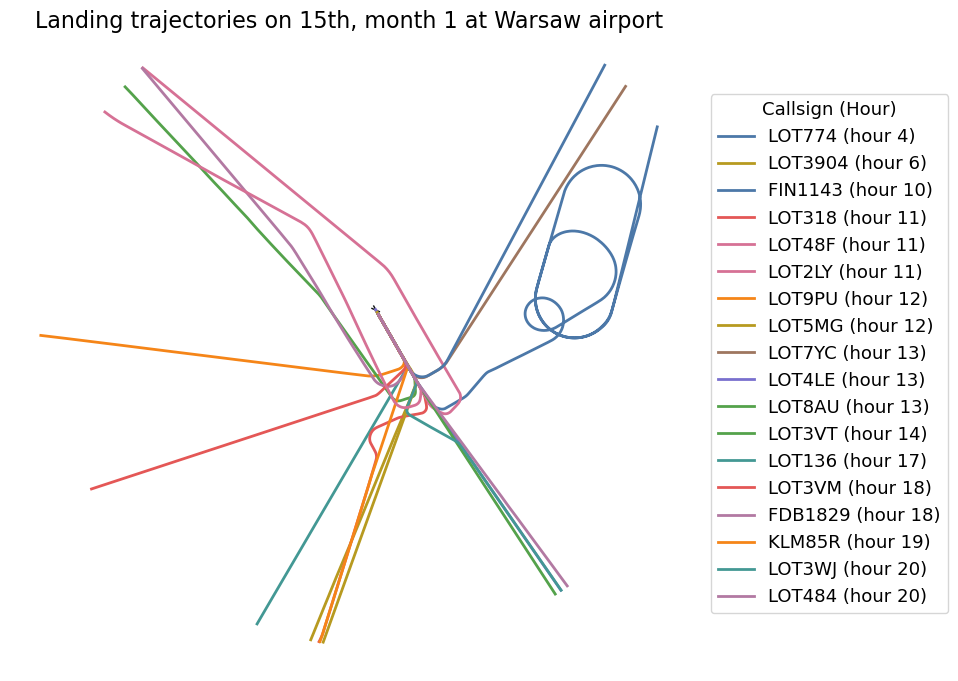

Month 2: 16 flights on 15th


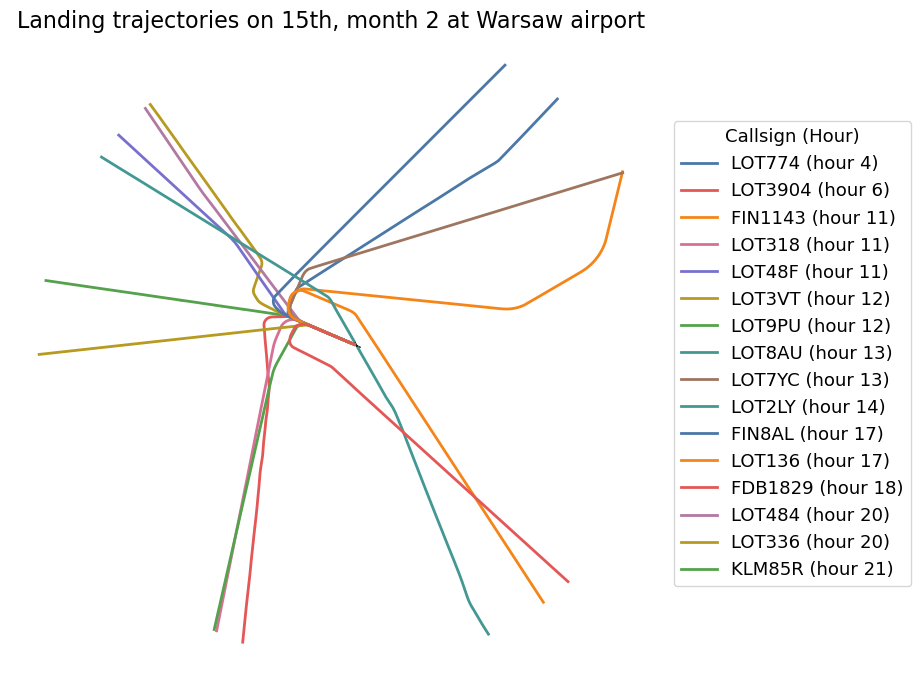

Month 3: 16 flights on 15th


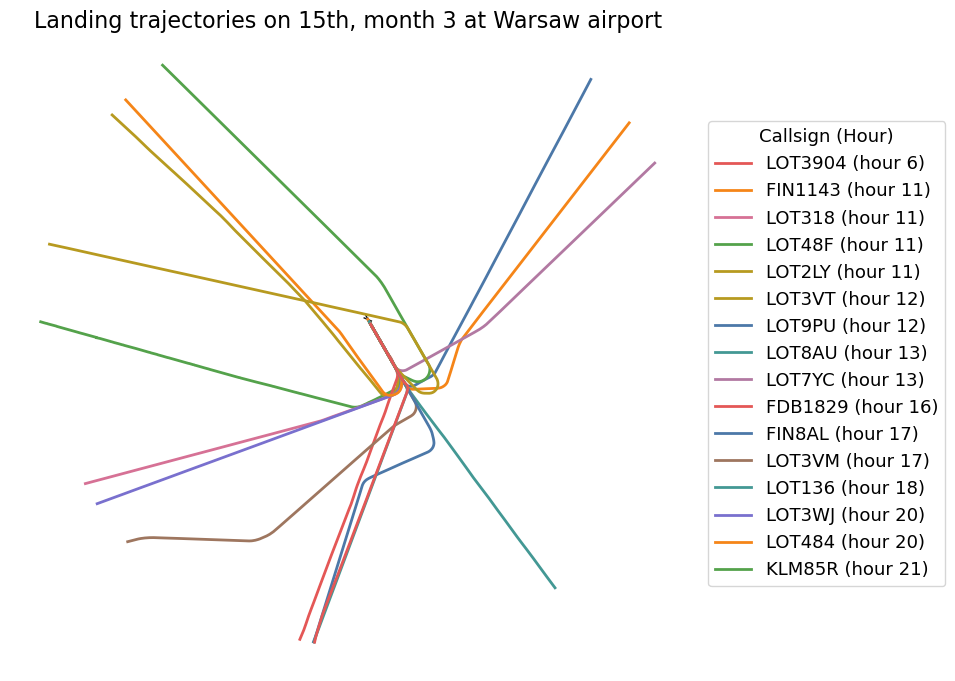

Month 4: 19 flights on 15th


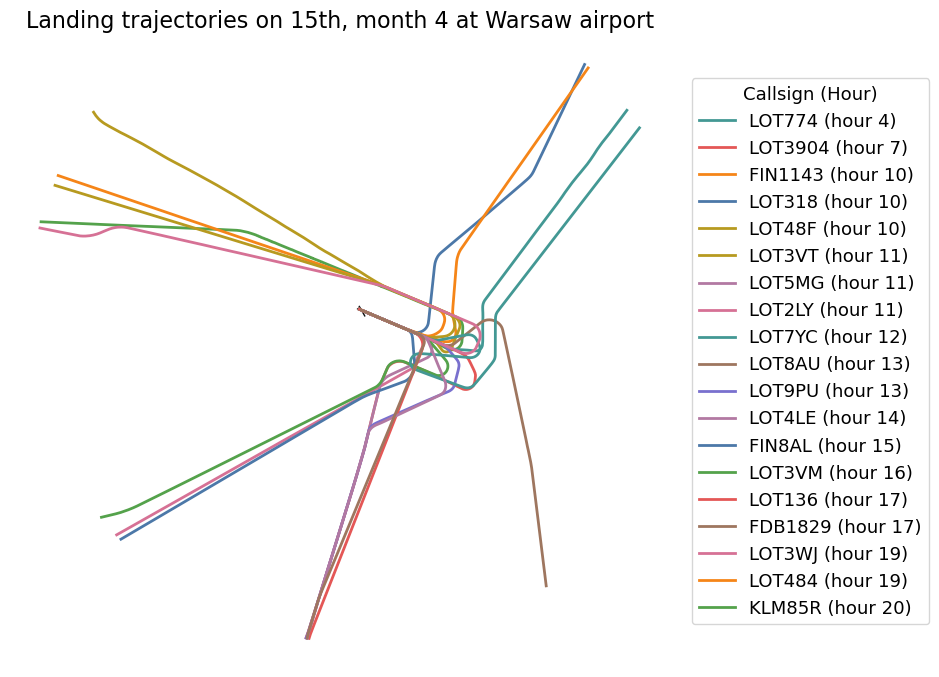

Month 5: 20 flights on 15th


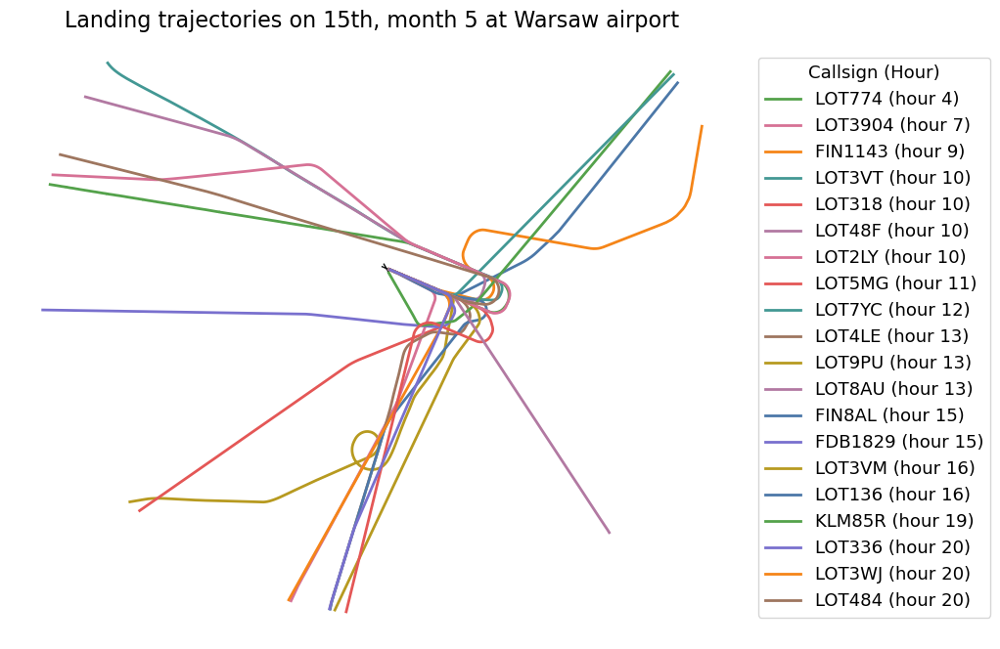

Month 6: 20 flights on 15th


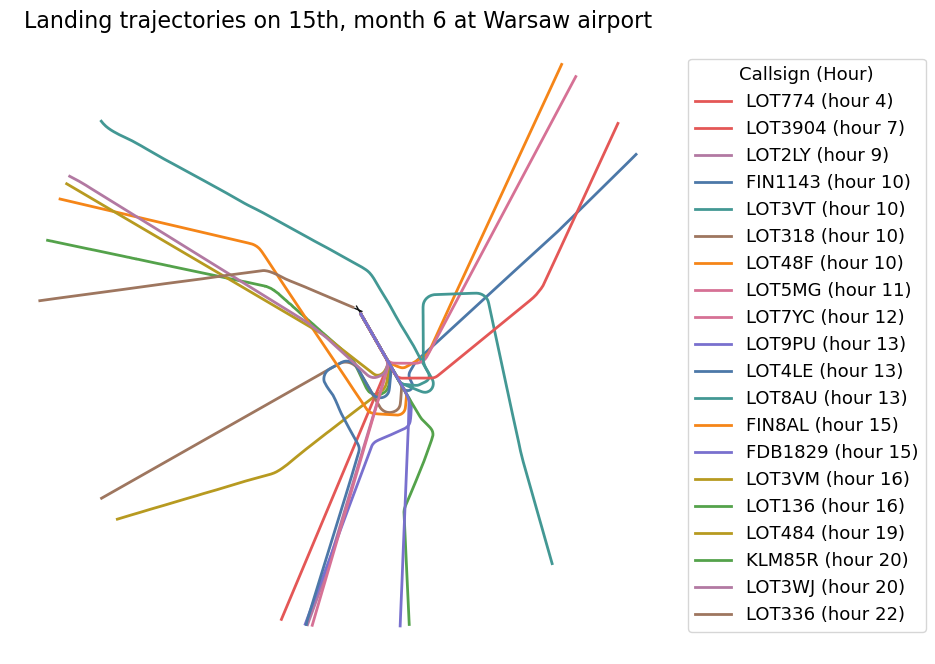

Month 7: 20 flights on 15th


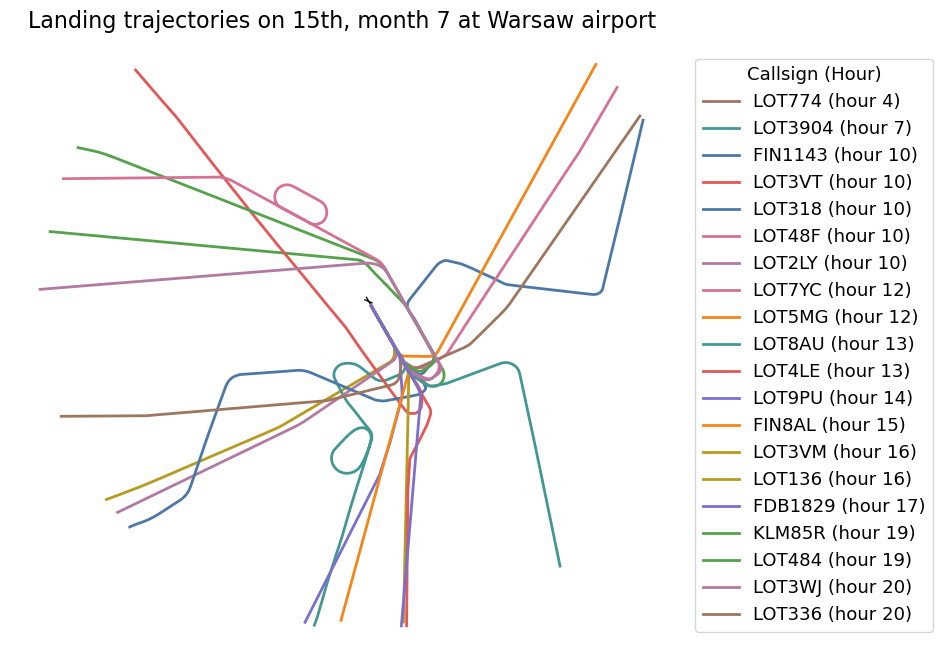

Month 8: 20 flights on 15th


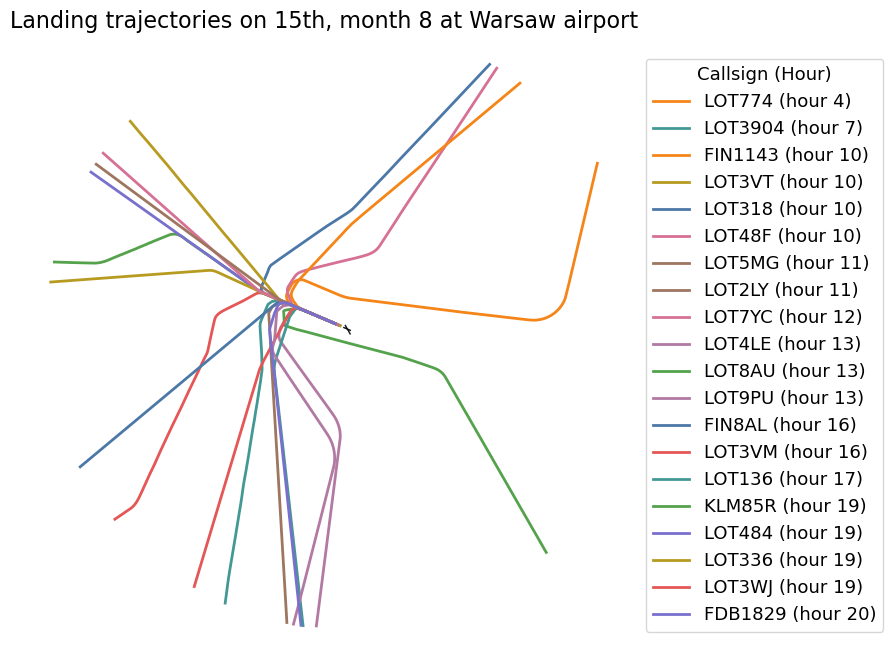

Month 9: 20 flights on 15th


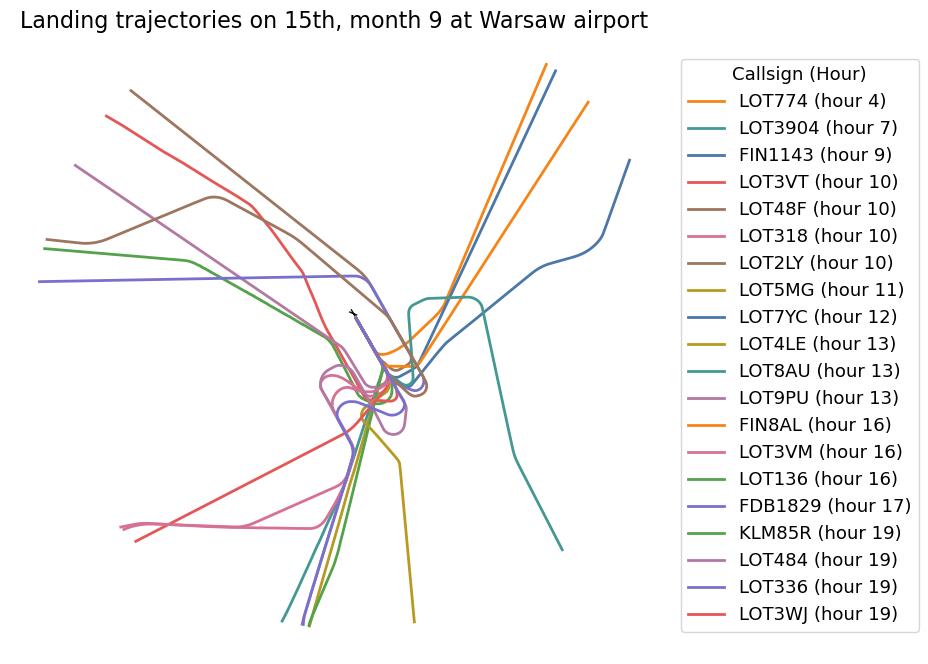

Month 10: 19 flights on 15th


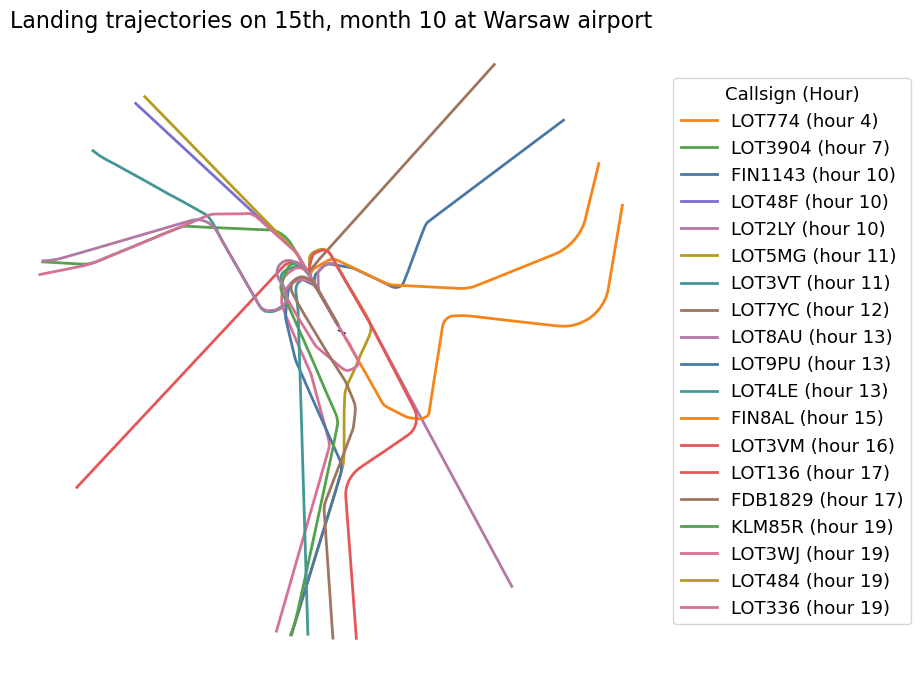

Month 11: 18 flights on 15th


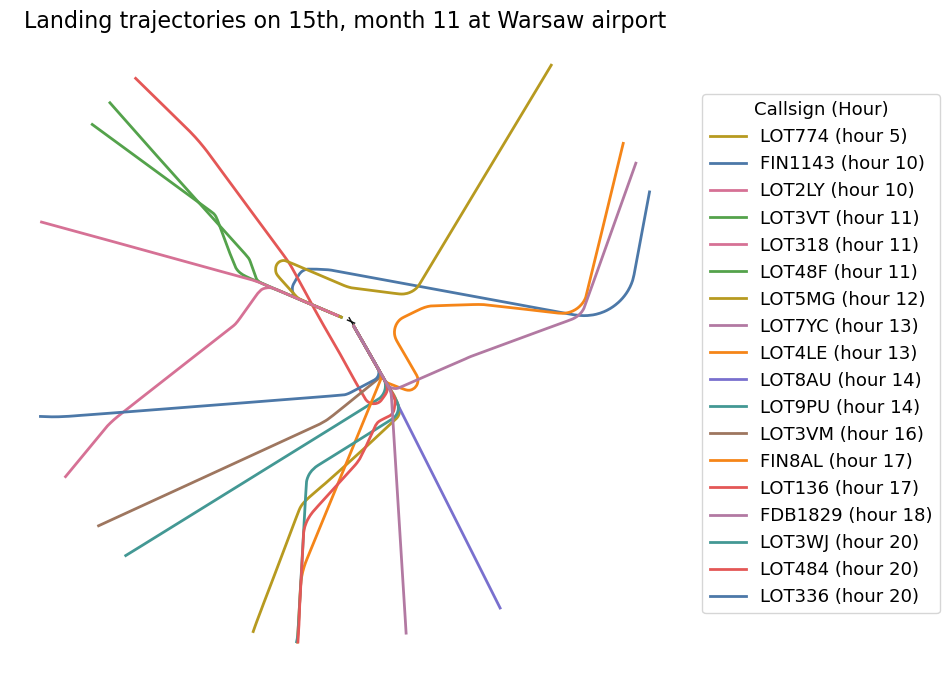

Month 12: 20 flights on 15th


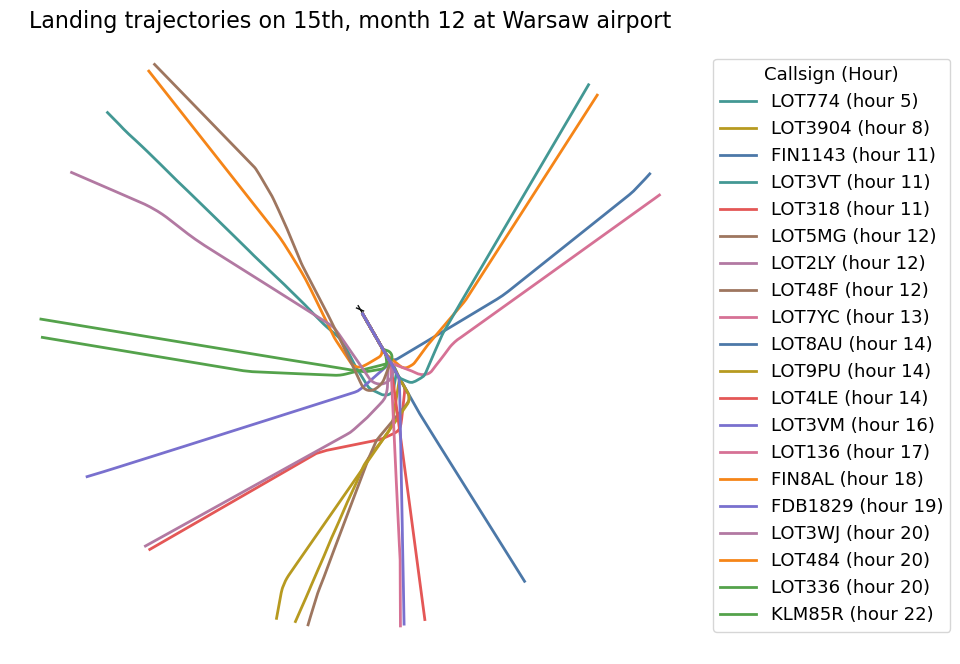

In [35]:
for month in sorted(traffic.data['month'].unique()):
    traffic_day15 = traffic.query(f"month == {month} and day == 15")
    print(f"Month {month}: {len(traffic_day15)} flights on 15th")

    with plt.style.context("traffic"):
        fig, ax = plt.subplots(subplot_kw=dict(projection=EPSG_2180()))
        airports["EPWA"].plot(ax, footprint=False, runways=dict(linewidth=1))
        legend_items = []
        for flight in traffic_day15:
            hour = flight.data.iloc[0]['hour']
            label = f"{flight.callsign} (hour {hour})"
            line = flight.plot(ax, linewidth=2, label=label)
            legend_items.append((hour, label, line))
        ax.set_title(f"Landing trajectories on 15th, month {month} at Warsaw airport")
        # Sort legend items by hour
        legend_items.sort(key=lambda x: x[0])
        handles = [item[2][0] if isinstance(item[2], list) else item[2] for item in legend_items]
        labels = [item[1] for item in legend_items]
        ax.legend(
            handles,
            labels,
            title="Callsign (Hour)",
            loc="center left",
            bbox_to_anchor=(1.02, 0.5)
        )
        plt.tight_layout()
    plt.show()

In [9]:
df = pd.read_csv("../weather/12375-2022.csv")

In [10]:
df.head()

,year,month,day,hour,temp,temp_source,rhum,rhum_source,prcp,prcp_source,...,wspd,wspd_source,wpgt,wpgt_source,pres,pres_source,cldc,cldc_source,coco,coco_source
0,2022,1,1,0,10.0,isd_lite,95,isd_lite,NaN,NaN,...,18.0,isd_lite,33.3,dwd_mosmix,1010.3,isd_lite,8.0,isd_lite,7.0,dwd_poi
1,2022,1,1,1,9.7,isd_lite,97,isd_lite,NaN,NaN,...,18.0,isd_lite,33.3,dwd_mosmix,1011.1,isd_lite,8.0,isd_lite,7.0,dwd_mosmix
2,2022,1,1,2,9.6,isd_lite,97,isd_lite,NaN,NaN,...,10.8,isd_lite,31.5,dwd_mosmix,1011.8,isd_lite,8.0,isd_lite,7.0,dwd_mosmix
3,2022,1,1,3,9.5,isd_lite,94,isd_lite,NaN,NaN,...,14.4,isd_lite,33.3,dwd_mosmix,1012.3,isd_lite,8.0,isd_lite,7.0,dwd_mosmix
4,2022,1,1,4,9.0,isd_lite,94,isd_lite,NaN,NaN,...,18.0,isd_lite,33.3,dwd_mosmix,1013.0,isd_lite,8.0,isd_lite,4.0,dwd_mosmix


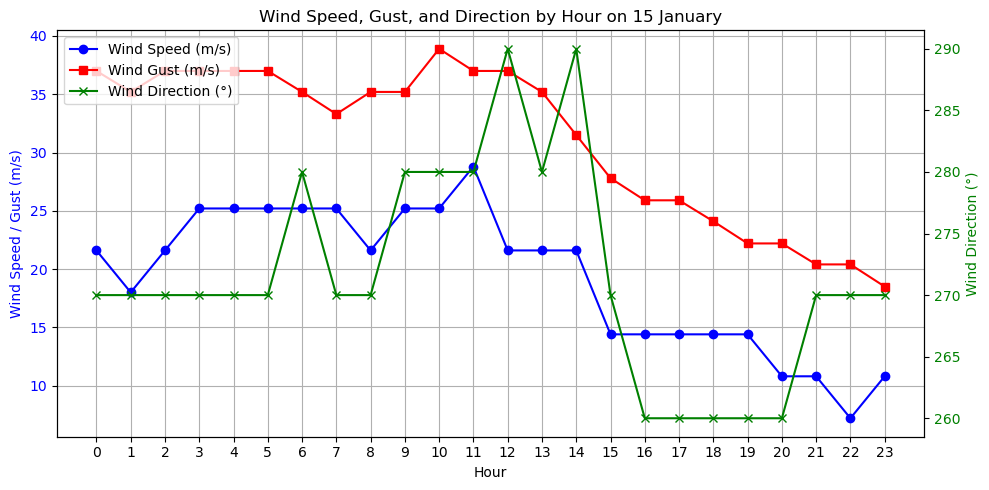

In [11]:
df_jan15 = df[(df['month'] == 1) & (df['day'] == 15)]
fig, ax1 = plt.subplots(figsize=(10, 5))

ax1.plot(df_jan15['hour'], df_jan15['wspd'], marker='o', color='b', label='Wind Speed (m/s)')
ax1.plot(df_jan15['hour'], df_jan15['wpgt'], marker='s', color='r', label='Wind Gust (m/s)')
ax1.set_xlabel('Hour')
ax1.set_ylabel('Wind Speed / Gust (m/s)', color='b')
ax1.tick_params(axis='y', labelcolor='b')
ax1.set_xticks(range(0, 24))
ax1.grid(True)

ax2 = ax1.twinx()
ax2.plot(df_jan15['hour'], df_jan15['wdir'], marker='x', color='g', label='Wind Direction (°)')
ax2.set_ylabel('Wind Direction (°)', color='g')
ax2.tick_params(axis='y', labelcolor='g')

lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

plt.title('Wind Speed, Gust, and Direction by Hour on 15 January')
fig.tight_layout()
plt.show()

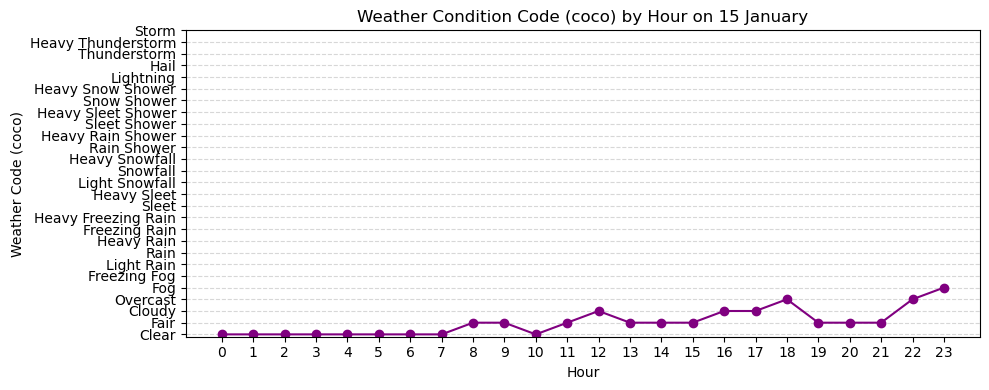

In [14]:
# Mapping of coco codes to weather condition labels
coco_labels = [
    "Clear", "Fair", "Cloudy", "Overcast", "Fog", "Freezing Fog", "Light Rain", "Rain", "Heavy Rain",
    "Freezing Rain", "Heavy Freezing Rain", "Sleet", "Heavy Sleet", "Light Snowfall", "Snowfall", "Heavy Snowfall",
    "Rain Shower", "Heavy Rain Shower", "Sleet Shower", "Heavy Sleet Shower", "Snow Shower", "Heavy Snow Shower",
    "Lightning", "Hail", "Thunderstorm", "Heavy Thunderstorm", "Storm"
]

fig, ax = plt.subplots(figsize=(10, 4))
ax.plot(df_jan15['hour'], df_jan15['coco'], marker='o', linestyle='-', color='purple')
ax.set_xlabel('Hour')
ax.set_ylabel('Weather Code (coco)')
ax.set_title('Weather Condition Code (coco) by Hour on 15 January')
ax.set_xticks(range(0, 24))
ax.set_yticks(range(1, 28))
ax.set_yticklabels(coco_labels)
ax.grid(True, axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

In [12]:
max_speed = df['wspd'].max()  # Or set a fixed value if you prefer
max_gust = df['wpgt'].max()  # Or set a fixed value if you prefer

/tmp/ipykernel_2149/57019264.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', n_flights)  # tab20 is more contrastive


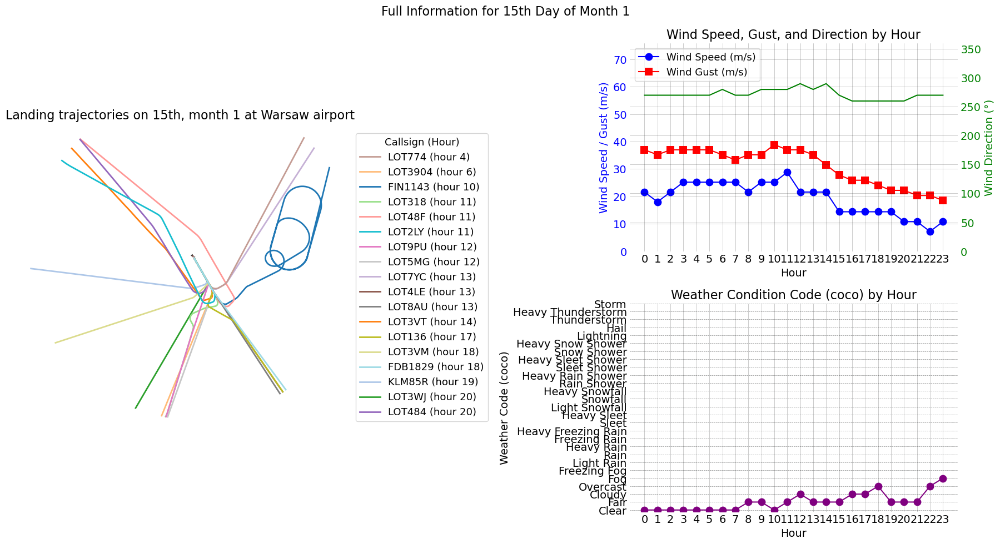

/tmp/ipykernel_2149/57019264.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', n_flights)  # tab20 is more contrastive


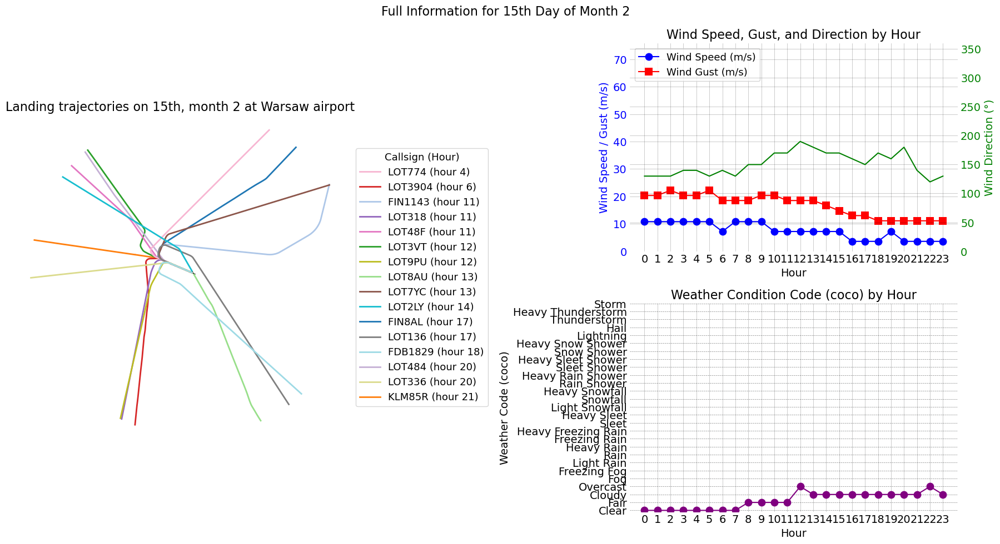

/tmp/ipykernel_2149/57019264.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', n_flights)  # tab20 is more contrastive


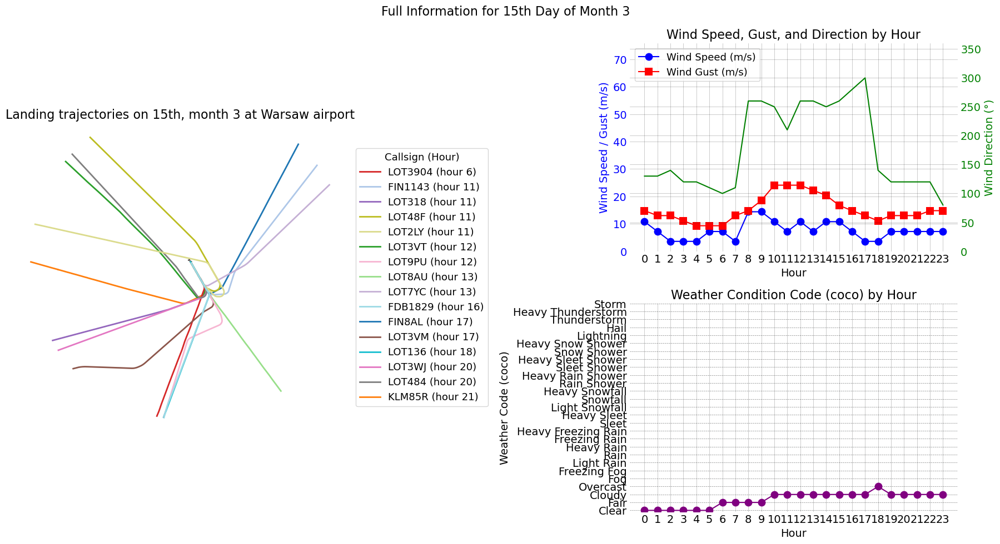

/tmp/ipykernel_2149/57019264.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', n_flights)  # tab20 is more contrastive


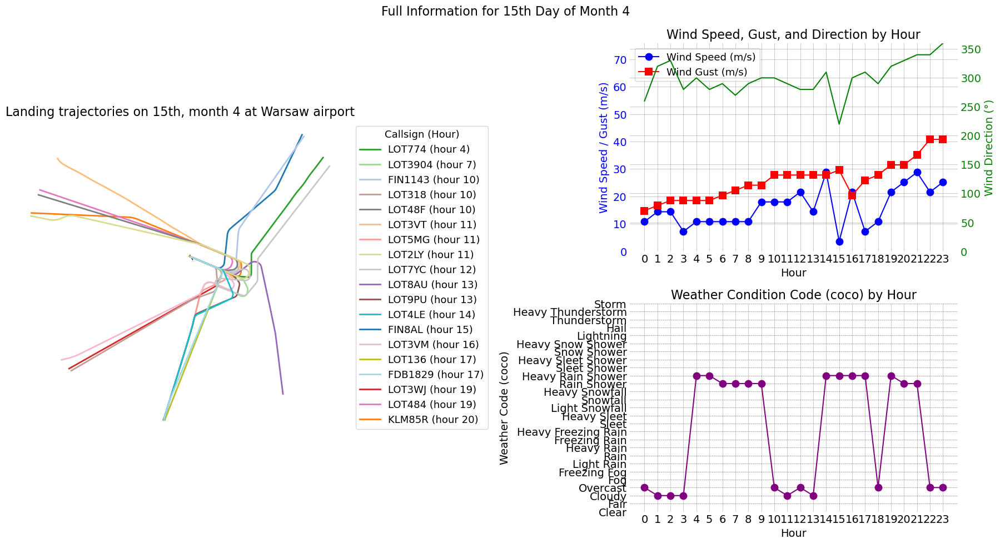

/tmp/ipykernel_2149/57019264.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', n_flights)  # tab20 is more contrastive


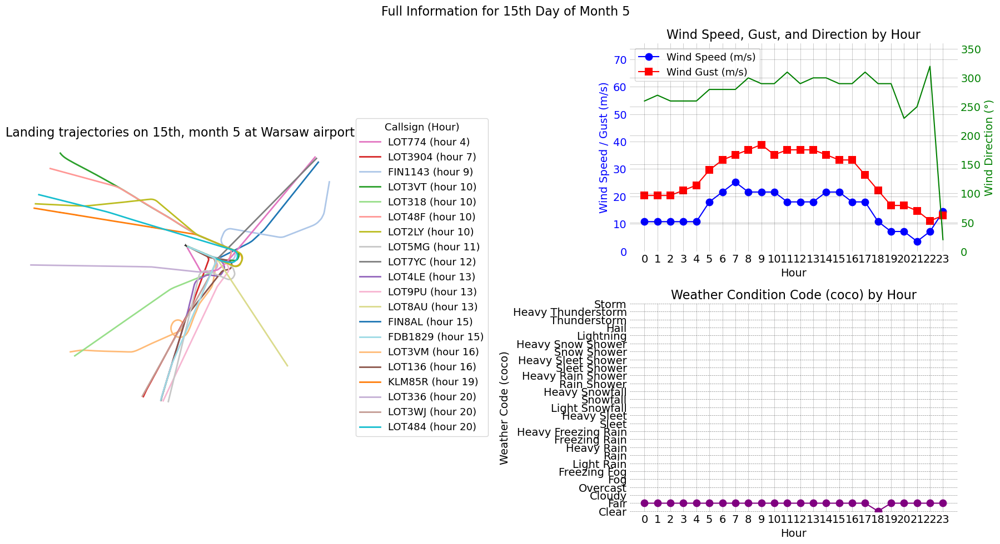

/tmp/ipykernel_2149/57019264.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', n_flights)  # tab20 is more contrastive


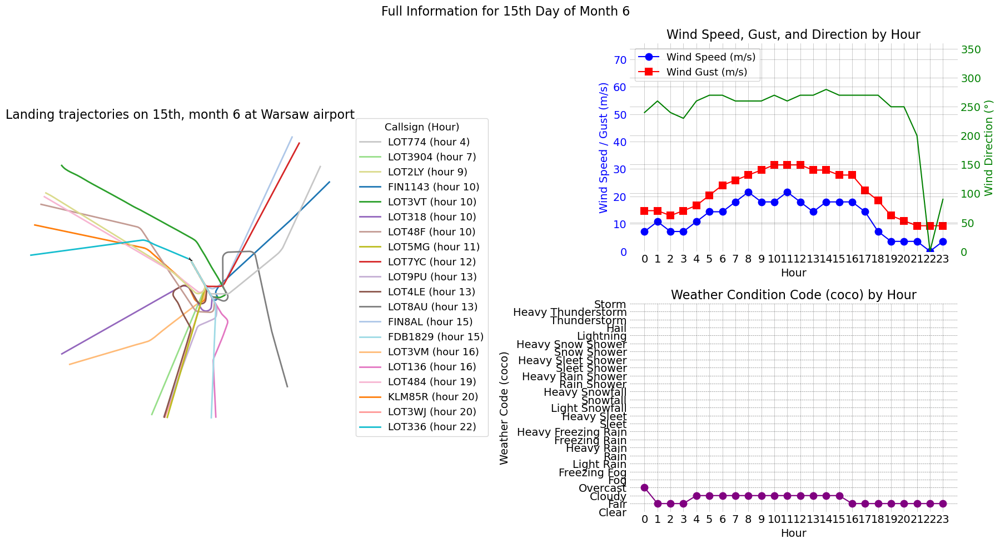

/tmp/ipykernel_2149/57019264.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', n_flights)  # tab20 is more contrastive


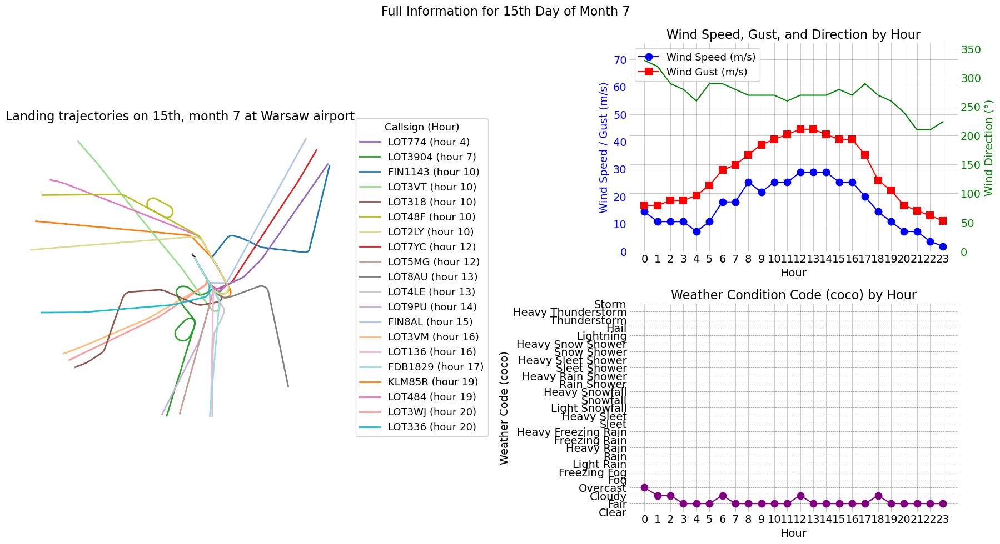

/tmp/ipykernel_2149/57019264.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', n_flights)  # tab20 is more contrastive


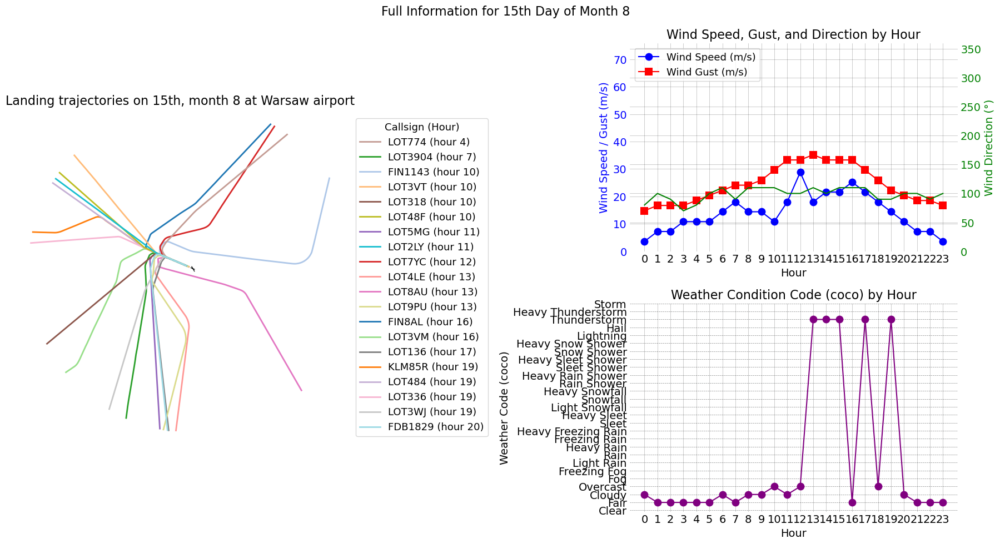

/tmp/ipykernel_2149/57019264.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', n_flights)  # tab20 is more contrastive


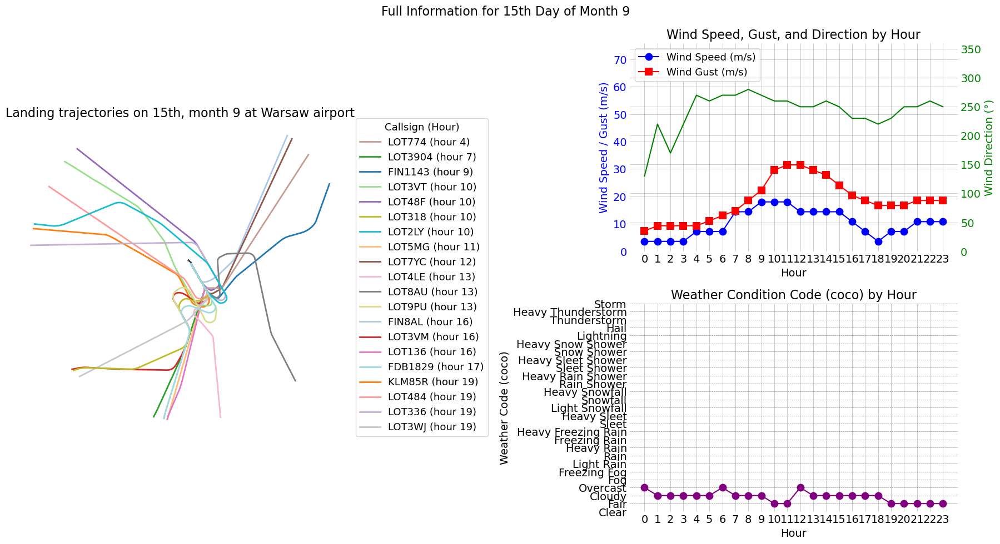

/tmp/ipykernel_2149/57019264.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', n_flights)  # tab20 is more contrastive


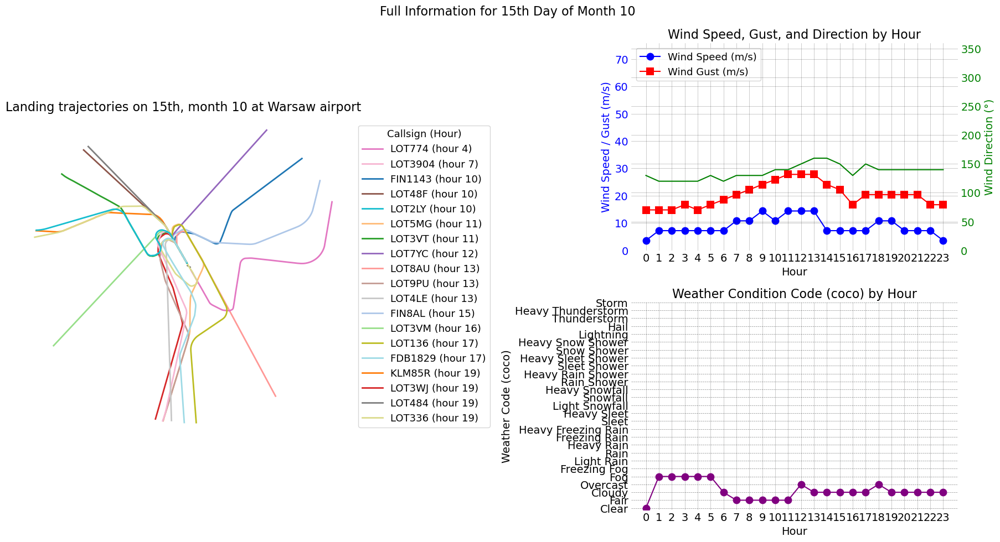

/tmp/ipykernel_2149/57019264.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', n_flights)  # tab20 is more contrastive


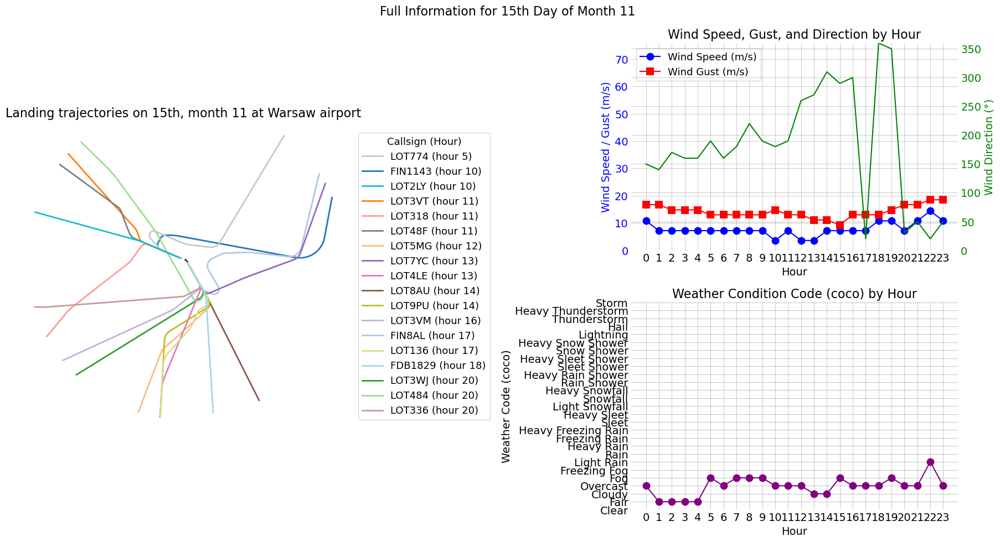

/tmp/ipykernel_2149/57019264.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', n_flights)  # tab20 is more contrastive


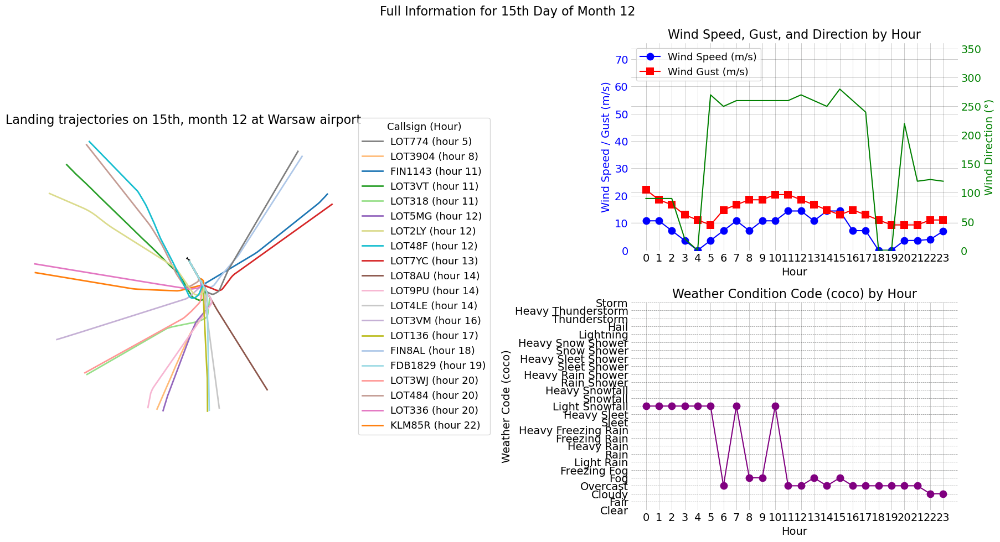

In [15]:
import numpy as np

import matplotlib.cm as cm

for month in sorted(traffic.data['month'].unique()):
    traffic_day15 = traffic.query(f"month == {month} and day == 15")
    df_day15 = df[(df['month'] == month) & (df['day'] == 15)]

    # Generate a color map with enough distinct colors
    n_flights = len(list(traffic_day15))
    colors = cm.get_cmap('tab20', n_flights)  # tab20 is more contrastive

    with plt.style.context("traffic"):
        fig = plt.figure(constrained_layout=True, figsize=(18, 10))
        gs = gridspec.GridSpec(2, 2, figure=fig)
        
        # Trajectories subplot
        ax0 = fig.add_subplot(gs[:, 0], projection=EPSG_2180())
        airports["EPWA"].plot(ax0, footprint=False, runways=dict(linewidth=1))
        legend_items = []
        for idx, flight in enumerate(traffic_day15):
            hour = flight.data.iloc[0]['hour']
            label = f"{flight.callsign} (hour {hour})"
            color = colors(idx)
            line = flight.plot(ax0, linewidth=2, label=label, color=color)
            legend_items.append((hour, label, line))
        ax0.set_title(f"Landing trajectories on 15th, month {month} at Warsaw airport")
        legend_items.sort(key=lambda x: x[0])
        handles = [item[2][0] if isinstance(item[2], list) else item[2] for item in legend_items]
        labels = [item[1] for item in legend_items]
        ax0.legend(
            handles,
            labels,
            title="Callsign (Hour)",
            loc="center left",
            bbox_to_anchor=(1.02, 0.5)
        )

        # Wind speed, gust & direction subplot
        ax1 = fig.add_subplot(gs[0, 1])
        ax1.plot(df_day15['hour'], df_day15['wspd'], marker='o', color='b', label='Wind Speed (m/s)')
        ax1.plot(df_day15['hour'], df_day15['wpgt'], marker='s', color='r', label='Wind Gust (m/s)')
        ax1.set_xlabel('Hour')
        ax1.set_ylabel('Wind Speed / Gust (m/s)', color='b')
        ax1.tick_params(axis='y', labelcolor='b')
        ax1.set_xticks(range(0, 24))
        ax1.grid(True)
        ax1.set_title('Wind Speed, Gust, and Direction by Hour')
        ax1.set_ylim(0, max(max_speed, max_gust))  # Set wind speed/gust scale
        ax1.legend(loc='upper left')

        ax2 = ax1.twinx()
        ax2.plot(df_day15['hour'], df_day15['wdir'], marker='x', color='g', label='Wind Direction (°)')
        ax2.set_ylabel('Wind Direction (°)', color='g')
        ax2.tick_params(axis='y', labelcolor='g')
        ax2.set_ylim(0, 360)  # Set wind direction scale

        # Weather code subplot
        ax3 = fig.add_subplot(gs[1, 1])
        ax3.plot(df_day15['hour'], df_day15['coco'], marker='o', linestyle='-', color='purple')
        ax3.set_xlabel('Hour')
        ax3.set_ylabel('Weather Code (coco)')
        ax3.set_title('Weather Condition Code (coco) by Hour')
        ax3.set_xticks(range(0, 24))
        ax3.set_yticks(range(1, 28))
        ax3.set_yticklabels(coco_labels)
        ax3.grid(True, axis='y', linestyle='--', alpha=0.5)

        plt.suptitle(f"Full Information for 15th Day of Month {month}", fontsize=16)
        plt.tight_layout()
        plt.show()

In [ ]:
date = pd.Timestamp("2022-01-15")
traffic_arrival = opensky.history(
    start=date, 
    arrival_airport="EPWA", 
    bounds=eurofirs["EPWW"].bounds
)

In [54]:
traffic_arrival = traffic_arrival.assign(
    quarter=lambda df: df.timestamp.dt.quarter,
    month=lambda df: df.timestamp.dt.month,
    day=lambda df: df.timestamp.dt.day,
    hour=lambda df: df.timestamp.dt.hour,
    weekday=lambda df: df.timestamp.dt.weekday,
)

In [55]:
traffic_arrival

,,count
icao24,callsign,
3dd37b,DHAIL,4767
48ad80,LOT412,4605
489325,LOT528,4356
48978a,LOT6KY,4299
461e1a,FIN1143,4110
4891b4,ENT1914,3992
489324,LOT5RW,3889
484f7e,KLM53L,3886
3944f1,AFR32EW,3848


In [51]:
traffic_departure = opensky.history(
    start=date,
    departure_airport="EPWA",
    bounds=eurofirs["EPWW"].bounds
)

RUNNING: : 75.9% [00:15, 4.97%/s]
DOWNLOAD: 256klines [00:39, 6.49klines/s]


In [56]:
traffic_departure = traffic_departure.assign(
    quarter=lambda df: df.timestamp.dt.quarter,
    month=lambda df: df.timestamp.dt.month,
    day=lambda df: df.timestamp.dt.day,
    hour=lambda df: df.timestamp.dt.hour,
    weekday=lambda df: df.timestamp.dt.weekday,
)

In [57]:
traffic_departure

,,count
icao24,callsign,
48ada5,LOT9LG,3911
489325,LOT5AV,3756
4601f9,FIN73P,3638
48ad82,LOT6TM,3547
489324,LOT52P,3462
48ad0e,LOT461,3461
489325,LOT7RM,3399
48932b,LOT5TY,3396
48978a,LOT6PD,3395


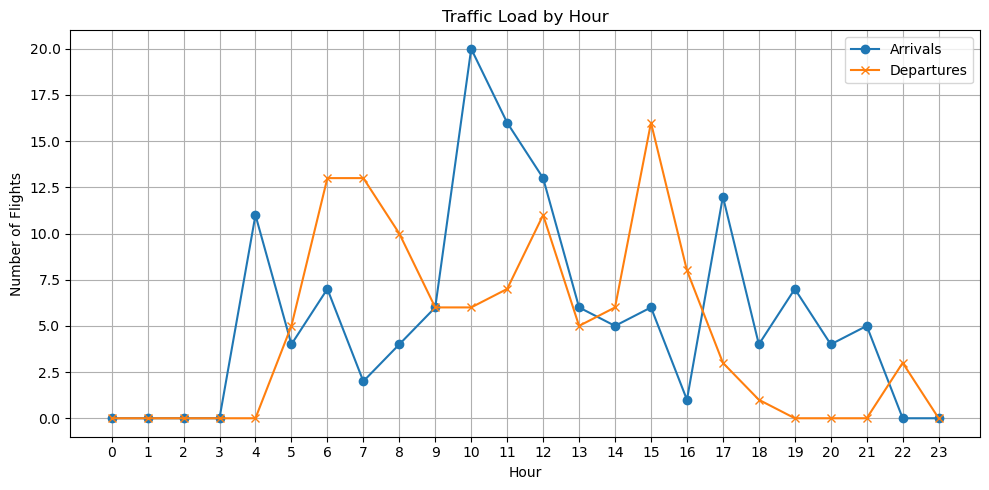

In [58]:
arrival_hours = [flight.data.iloc[0]['hour'] for flight in traffic_arrival]
departure_hours = [flight.data.iloc[0]['hour'] for flight in traffic_departure]

# Count flights per hour
arrival_counts = pd.Series(arrival_hours).value_counts().sort_index()
departure_counts = pd.Series(departure_hours).value_counts().sort_index()

# Ensure all hours are present
hours = range(0, 24)
arrival_counts = arrival_counts.reindex(hours, fill_value=0)
departure_counts = departure_counts.reindex(hours, fill_value=0)

# Plot
plt.figure(figsize=(10, 5))
plt.plot(hours, arrival_counts, marker='o', label='Arrivals')
plt.plot(hours, departure_counts, marker='x', label='Departures')
plt.xlabel('Hour')
plt.ylabel('Number of Flights')
plt.title('Traffic Load by Hour')
plt.xticks(hours)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

In [20]:
traffic_arival_by_month = {}
traffic_departure_by_month = {}

for month in tqdm([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]):
    date = pd.Timestamp(f"2022-{month:02d}-15")
    traffic_arrival = opensky.history(
        start=date,
        arrival_airport="EPWA",
        bounds=eurofirs["EPWW"].bounds,
    )
    traffic_departure = opensky.history(
        start=date,
        departure_airport="EPWA",
        bounds=eurofirs["EPWW"].bounds,
    )
    traffic_departure_by_month[month] = traffic_departure.assign(
        quarter=lambda df: df.timestamp.dt.quarter,
        month=lambda df: df.timestamp.dt.month,
        day=lambda df: df.timestamp.dt.day,
        hour=lambda df: df.timestamp.dt.hour,
        weekday=lambda df: df.timestamp.dt.weekday,
    )
    traffic_arival_by_month[month] = traffic_arrival.assign(
        quarter=lambda df: df.timestamp.dt.quarter,
        month=lambda df: df.timestamp.dt.month,
        day=lambda df: df.timestamp.dt.day,
        hour=lambda df: df.timestamp.dt.hour,
        weekday=lambda df: df.timestamp.dt.weekday,
    )
    del traffic_arrival, traffic_departure


RUNNING: : 72.0% [00:12, 5.64%/s]01,  1.64s/it]
DOWNLOAD: 447klines [01:17, 5.80klines/s]
100%|██████████| 12/12 [25:08<00:00, 125.67s/it]


/tmp/ipykernel_2149/417221011.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', n_flights)


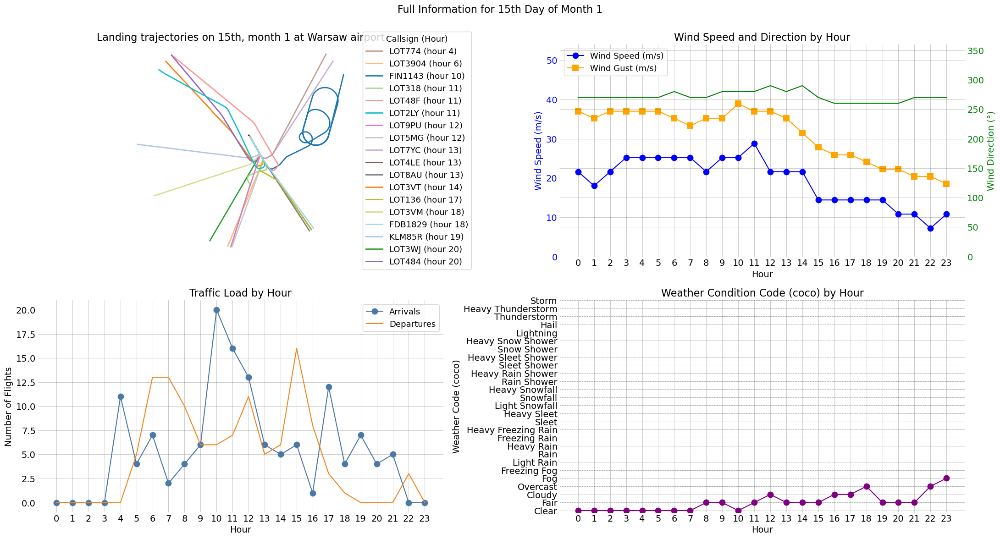

/tmp/ipykernel_2149/417221011.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', n_flights)


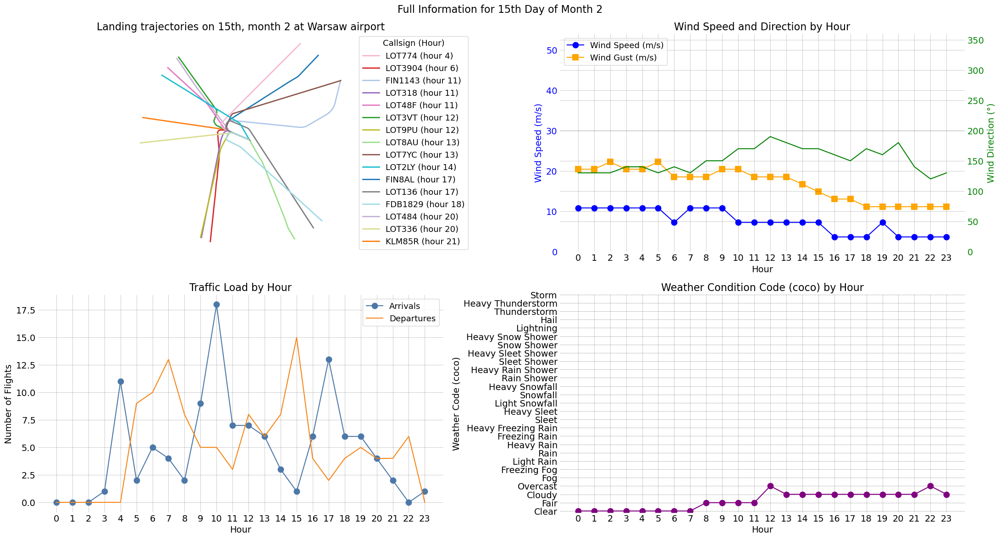

/tmp/ipykernel_2149/417221011.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', n_flights)


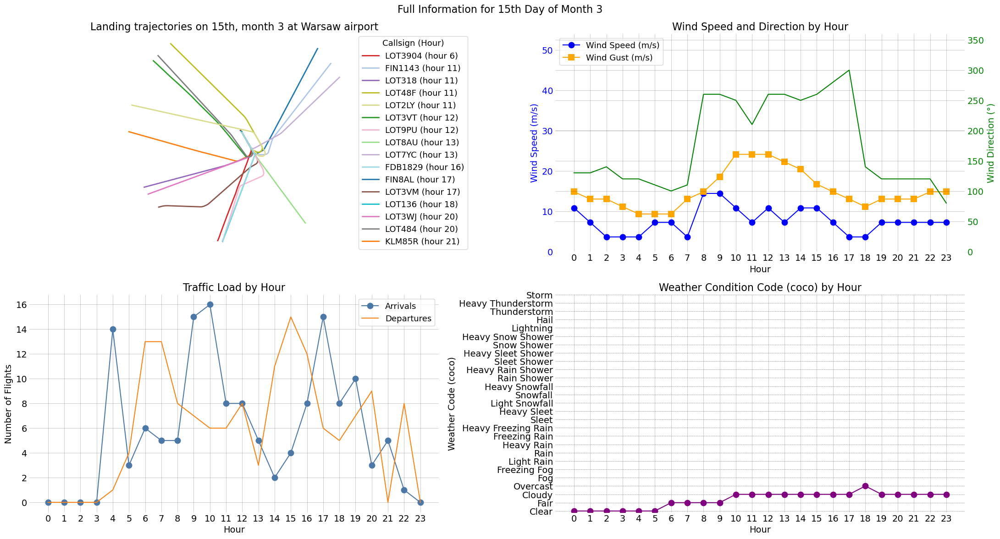

/tmp/ipykernel_2149/417221011.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', n_flights)


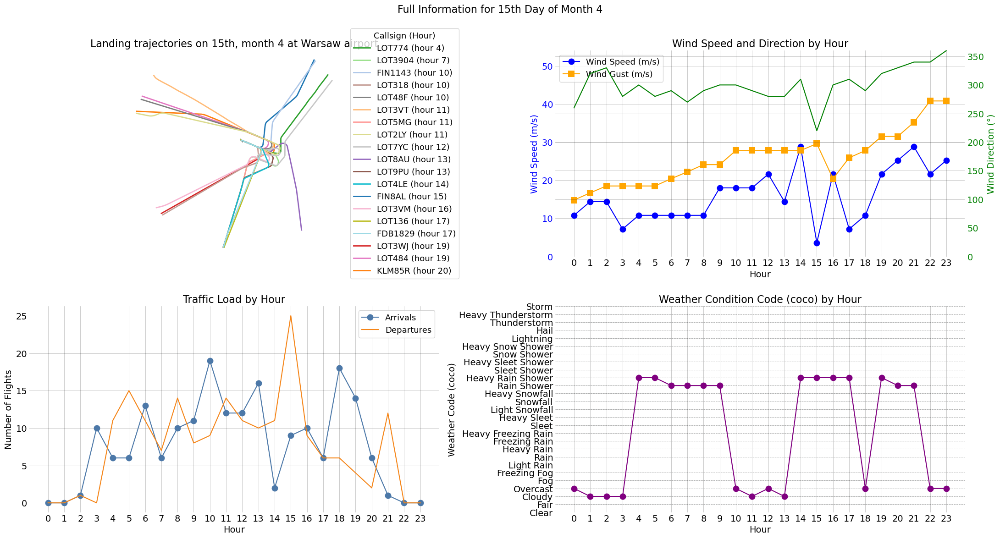

/tmp/ipykernel_2149/417221011.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', n_flights)


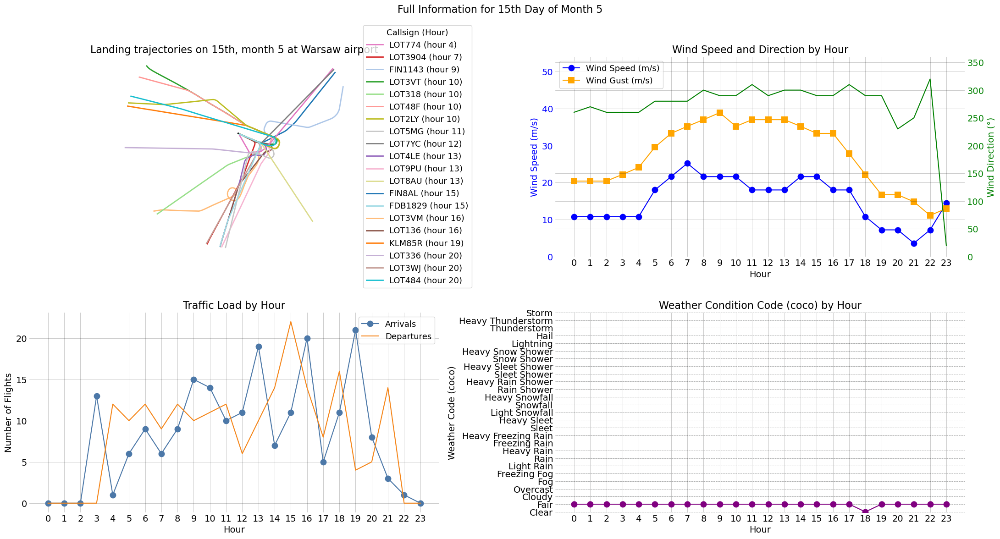

/tmp/ipykernel_2149/417221011.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', n_flights)


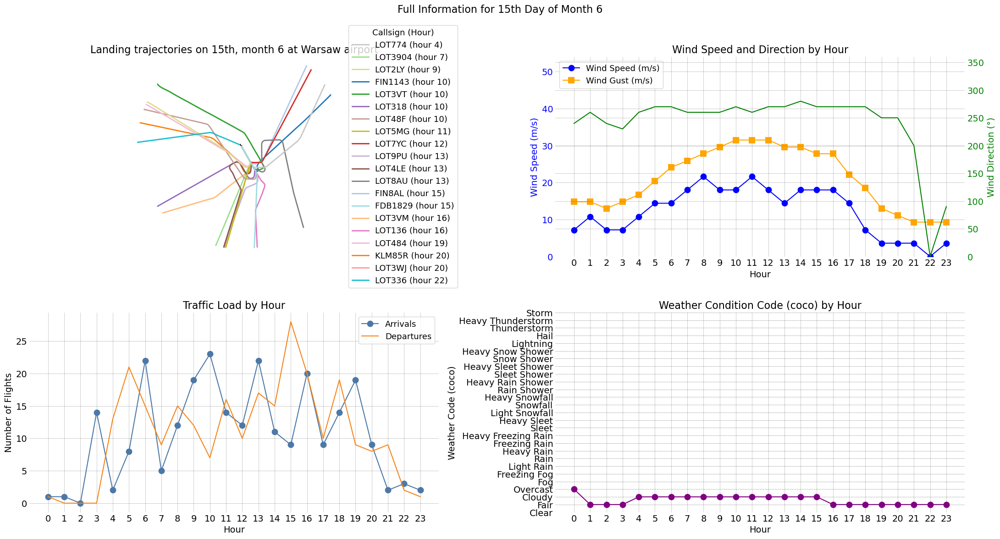

/tmp/ipykernel_2149/417221011.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', n_flights)


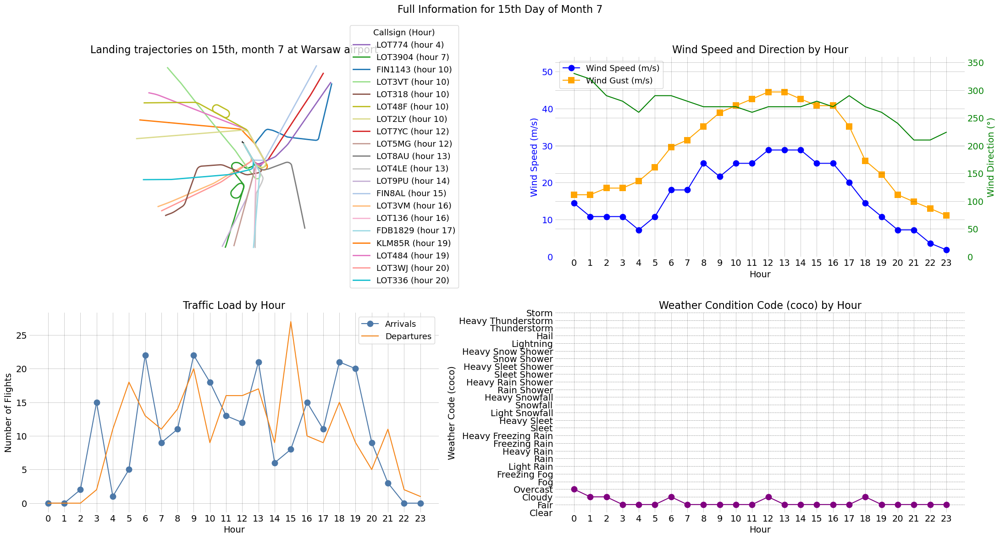

/tmp/ipykernel_2149/417221011.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', n_flights)


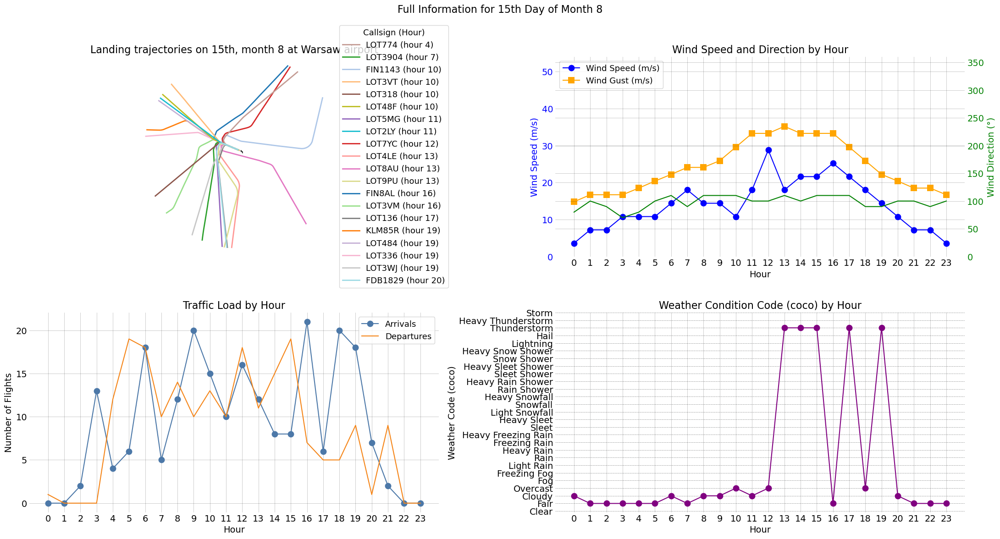

/tmp/ipykernel_2149/417221011.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', n_flights)


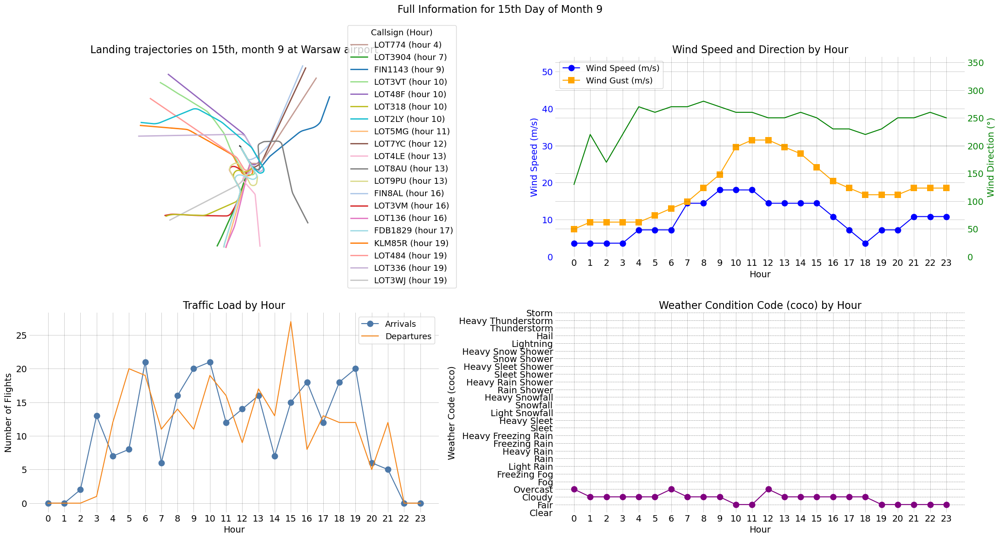

/tmp/ipykernel_2149/417221011.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', n_flights)


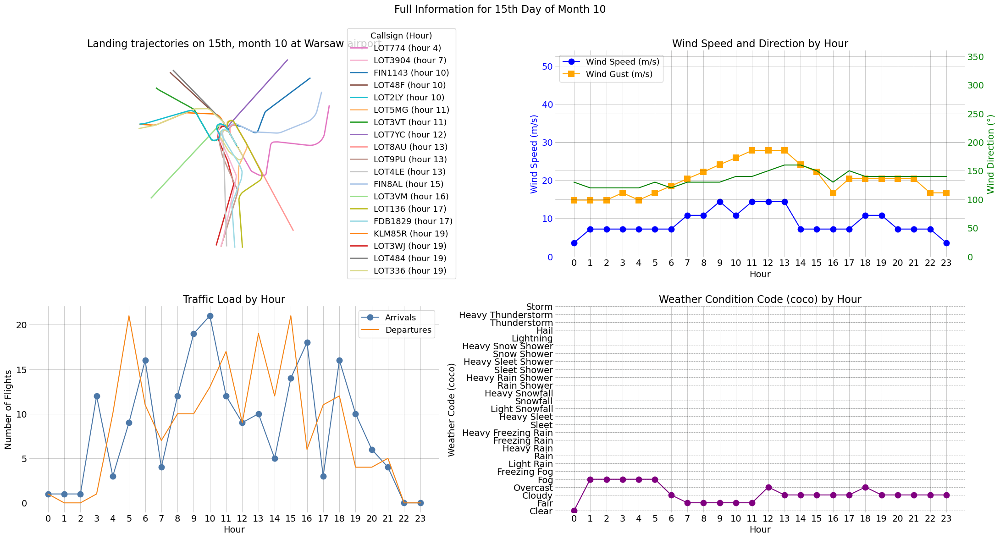

/tmp/ipykernel_2149/417221011.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', n_flights)


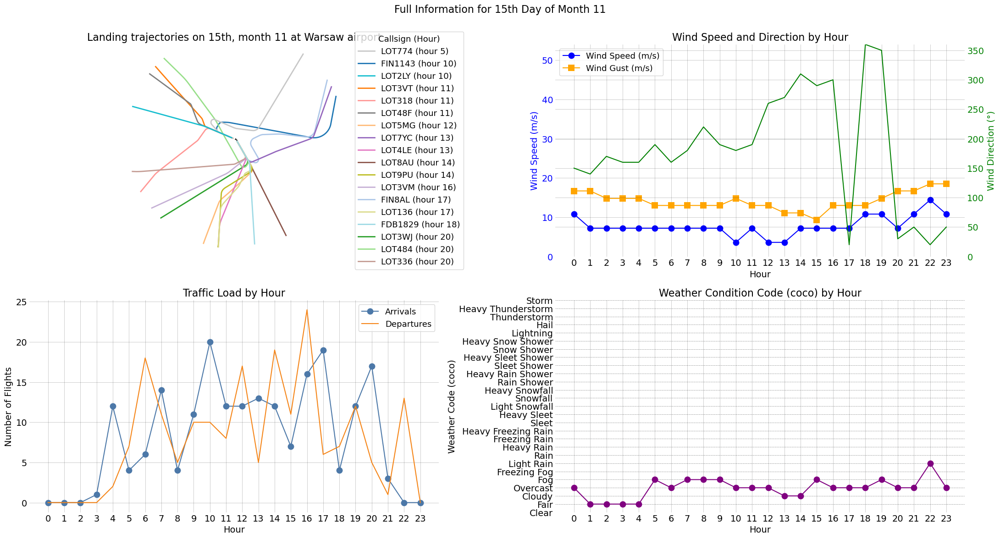

/tmp/ipykernel_2149/417221011.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab20', n_flights)


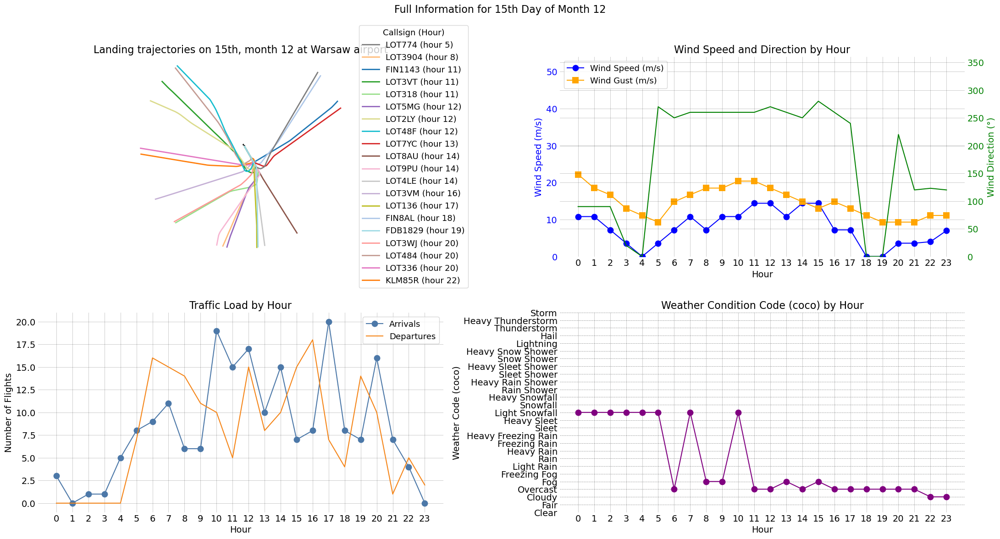

In [22]:
for month in sorted(traffic.data['month'].unique()):
    traffic_day15 = traffic.query(f"month == {month} and day == 15")
    traffic_arrival = traffic_arival_by_month[month]
    traffic_departure = traffic_departure_by_month[month]
    df_day15 = df[(df['month'] == month) & (df['day'] == 15)]

    # Generate a color map with enough distinct colors
    n_flights = len(list(traffic_day15))
    colors = cm.get_cmap('tab20', n_flights)

    # Prepare traffic load data
    arrival_hours = [
        flight.data.iloc[0]['hour']
        for flight in traffic_arrival
        if flight.data.iloc[0]['month'] == month and flight.data.iloc[0]['day'] == 15
    ]
    departure_hours = [
        flight.data.iloc[0]['hour']
        for flight in traffic_departure
        if flight.data.iloc[0]['month'] == month and flight.data.iloc[0]['day'] == 15
    ]
    arrival_counts = pd.Series(arrival_hours).value_counts().sort_index().reindex(range(0, 24), fill_value=0)
    departure_counts = pd.Series(departure_hours).value_counts().sort_index().reindex(range(0, 24), fill_value=0)

    max_speed = df['wspd'].max() if not df['wspd'].empty else 20  # fallback if empty

    with plt.style.context("traffic"):
        fig = plt.figure(constrained_layout=True, figsize=(22, 12))
        gs = gridspec.GridSpec(2, 2, figure=fig)

        # Trajectories subplot (left, spans both rows)
        ax0 = fig.add_subplot(gs[0, 0], projection=EPSG_2180())
        airports["EPWA"].plot(ax0, footprint=False, runways=dict(linewidth=1))
        legend_items = []
        for idx, flight in enumerate(traffic_day15):
            hour = flight.data.iloc[0]['hour']
            label = f"{flight.callsign} (hour {hour})"
            color = colors(idx)
            line = flight.plot(ax0, linewidth=2, label=label, color=color)
            legend_items.append((hour, label, line))
        ax0.set_title(f"Landing trajectories on 15th, month {month} at Warsaw airport")
        legend_items.sort(key=lambda x: x[0])
        handles = [item[2][0] if isinstance(item[2], list) else item[2] for item in legend_items]
        labels = [item[1] for item in legend_items]
        ax0.legend(
            handles,
            labels,
            title="Callsign (Hour)",
            loc="center left",
            bbox_to_anchor=(1.02, 0.5)
        )

        # Wind speed & direction subplot (top middle)
        ax1 = fig.add_subplot(gs[0, 1])
        ax1.plot(df_day15['hour'], df_day15['wspd'], marker='o', color='b', label='Wind Speed (m/s)')
        if 'wpgt' in df_day15.columns and not df_day15['wpgt'].isnull().all():
            ax1.plot(df_day15['hour'], df_day15['wpgt'], marker='s', color='orange', label='Wind Gust (m/s)')
        ax1.set_xlabel('Hour')
        ax1.set_ylabel('Wind Speed (m/s)', color='b')
        ax1.tick_params(axis='y', labelcolor='b')
        ax1.set_xticks(range(0, 24))
        ax1.grid(True)
        ax1.set_title('Wind Speed and Direction by Hour')
        ax1.set_ylim(0, max_speed)
        ax1.legend(loc='upper left')

        ax2 = ax1.twinx()
        ax2.plot(df_day15['hour'], df_day15['wdir'], marker='x', color='g', label='Wind Direction (°)')
        ax2.set_ylabel('Wind Direction (°)', color='g')
        ax2.tick_params(axis='y', labelcolor='g')
        ax2.set_ylim(0, 360)

        # Weather code subplot (bottom middle)
        ax3 = fig.add_subplot(gs[1, 1])
        ax3.plot(df_day15['hour'], df_day15['coco'], marker='o', linestyle='-', color='purple')
        ax3.set_xlabel('Hour')
        ax3.set_ylabel('Weather Code (coco)')
        ax3.set_title('Weather Condition Code (coco) by Hour')
        ax3.set_xticks(range(0, 24))
        ax3.set_yticks(range(1, 28))
        ax3.set_yticklabels(coco_labels)
        ax3.grid(True, axis='y', linestyle='--', alpha=0.5)

        # Traffic load subplot (right, spans both rows)
        ax4 = fig.add_subplot(gs[1, 0])
        ax4.plot(range(0, 24), arrival_counts, marker='o', label='Arrivals')
        ax4.plot(range(0, 24), departure_counts, marker='x', label='Departures')
        ax4.set_xlabel('Hour')
        ax4.set_ylabel('Number of Flights')
        ax4.set_title('Traffic Load by Hour')
        ax4.set_xticks(range(0, 24))
        ax4.grid(True)
        ax4.legend()

        plt.suptitle(f"Full Information for 15th Day of Month {month}", fontsize=16)
        plt.tight_layout()
        plt.show()